<img align="left" src="https://lever-client-logos.s3.amazonaws.com/864372b1-534c-480e-acd5-9711f850815c-1524247202159.png" width=200>
<br></br>
<br></br>

# Major Neural Network Architectures Challenge
## *Data Science Unit 4 Sprint 3 Challenge*

In this sprint challenge, you'll explore some of the cutting edge of Data Science. This week we studied several famous neural network architectures: 
recurrent neural networks (RNNs), long short-term memory (LSTMs), convolutional neural networks (CNNs), and Generative Adverserial Networks (GANs). In this sprint challenge, you will revisit these models. Remember, we are testing your knowledge of these architectures not your ability to fit a model with high accuracy. 

__*Caution:*__  these approaches can be pretty heavy computationally. All problems were designed so that you should be able to achieve results within at most 5-10 minutes of runtime on Colab or a comparable environment. If something is running longer, doublecheck your approach!

## Challenge Objectives
*You should be able to:*
* <a href="#p1">Part 1</a>: Train a RNN classification model
* <a href="#p2">Part 2</a>: Utilize a pre-trained CNN for objective detection
* <a href="#p3">Part 3</a>: Describe the difference between a discriminator and generator in a GAN
* <a href="#p4">Part 4</a>: Describe yourself as a Data Science and elucidate your vision of AI

<a id="p1"></a>
## Part 1 - RNNs

Use an RNN to fit a multi-class classification model on reuters news articles to distinguish topics of articles. The data is already encoded properly for use in an RNN model. 

Your Tasks: 
- Use Keras to fit a predictive model, classifying news articles into topics. 
- Report your overall score and accuracy

For reference, the [Keras IMDB sentiment classification example](https://github.com/keras-team/keras/blob/master/examples/imdb_lstm.py) will be useful, as well the RNN code we used in class.

__*Note:*__  Focus on getting a running model, not on maxing accuracy with extreme data size or epoch numbers. Only revisit and push accuracy if you get everything else done!

In [1]:
from tensorflow.keras.datasets import reuters

(x_train, y_train), (x_test, y_test) = reuters.load_data(num_words=None,
                                                         skip_top=0,
                                                         maxlen=None,
                                                         test_split=0.2,
                                                         seed=723812,
                                                         start_char=1,
                                                         oov_char=2,
                                                         index_from=3)

2113536/2110848 [==============================] - 1s 0us/step


In [2]:
# Demo of encoding

word_index = reuters.get_word_index(path="reuters_word_index.json")

print(f"Iran is encoded as {word_index['iran']} in the data")
print(f"London is encoded as {word_index['london']} in the data")
print("Words are encoded as numbers in our dataset.")

557056/550378 [==============================] - 0s 0us/step
Iran is encoded as 779 in the data
London is encoded as 544 in the data
Words are encoded as numbers in our dataset.


In [13]:
from keras.layers import SimpleRNN
from keras.models import Sequential
from keras.layers import Embedding, SimpleRNN
from keras.layers import Dense

In [14]:
from keras.datasets import reuters
from keras.preprocessing import sequence

max_features = 10000  # number of words to consider as features
maxlen = 500  # cut texts after this number of words (among top max_features most common words)
batch_size = 64

print('Loading data...')
(input_train, y_train), (input_test, y_test) = reuters.load_data(num_words=max_features)
print(len(input_train), 'train sequences')
print(len(input_test), 'test sequences')

print('Pad sequences (samples x time)')
input_train = sequence.pad_sequences(input_train, maxlen=maxlen)
input_test = sequence.pad_sequences(input_test, maxlen=maxlen)
print('input_train shape:', input_train.shape)
print('input_test shape:', input_test.shape)
print('y_train shape:', y_train.shape)
print('y_test shape:', y_test.shape)

Loading data...
8982 train sequences
2246 test sequences
Pad sequences (samples x time)
input_train shape: (8982, 500)
input_test shape: (2246, 500)
y_train shape: (8982,)
y_test shape: (2246,)


In [15]:
from keras.utils import np_utils

y_train = np_utils.to_categorical(y_train, 46)
y_test = np_utils.to_categorical(y_test, 46)

In [21]:
from keras.models import Sequential
from keras.layers import Embedding, SimpleRNN
from keras.layers import Dense

model = Sequential()
model.add(Embedding(max_features, 64))
model.add(SimpleRNN(64, return_sequences=True))
model.add(SimpleRNN(64))
model.add(Dense(46, activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['acc'])
history = model.fit(input_train, y_train,
                    epochs=10,
                    batch_size=128,
                    validation_split=0.3)

Train on 6287 samples, validate on 2695 samples
Epoch 1/10
6287/6287 [==============================] - 20s 3ms/step - loss: 2.7096 - acc: 0.3329 - val_loss: 2.2210 - val_acc: 0.4531
Epoch 2/10
6287/6287 [==============================] - 16s 3ms/step - loss: 2.0624 - acc: 0.4866 - val_loss: 2.0996 - val_acc: 0.4861
Epoch 3/10
6287/6287 [==============================] - 16s 3ms/step - loss: 1.6972 - acc: 0.5697 - val_loss: 2.0405 - val_acc: 0.4946
Epoch 4/10
6287/6287 [==============================] - 18s 3ms/step - loss: 1.1488 - acc: 0.7271 - val_loss: 2.1005 - val_acc: 0.5028
Epoch 5/10
6287/6287 [==============================] - 19s 3ms/step - loss: 0.7358 - acc: 0.8429 - val_loss: 2.1548 - val_acc: 0.5020
Epoch 6/10
6287/6287 [==============================] - 19s 3ms/step - loss: 0.4769 - acc: 0.9157 - val_loss: 2.2309 - val_acc: 0.5109
Epoch 7/10
6287/6287 [==============================] - 17s 3ms/step - loss: 0.3311 - acc: 0.9480 - val_loss: 2.3264 - val_acc: 0.5020
Epoch 8

In [22]:
score, acc = model.evaluate(input_test, y_test,
                            batch_size=batch_size)
print('Test score:', score)
print('Test accuracy:', acc)

2246/2246 [==============================] - 2s 1ms/step
Test score: 2.41931018379259
Test accuracy: 0.5124666073284081


Conclusion - RNN runs, and gives pretty decent improvement over a naive model. To *really* improve the model, more playing with parameters would help. Also - RNN may well not be the best approach here, but it is at least a valid one.

<a id="p2"></a>
## Part 2- CNNs

### Find the Frog

Time to play "find the frog!" Use Keras and ResNet50 (pre-trained) to detect which of the following images contain frogs:

<img align="left" src="https://d3i6fh83elv35t.cloudfront.net/newshour/app/uploads/2017/03/GettyImages-654745934-1024x687.jpg" width=400>


In [23]:
!pip install google_images_download

In [24]:
from google_images_download import google_images_download

response = google_images_download.googleimagesdownload()
arguments = {"keywords": "animal pond", "limit": 5, "print_urls": True}
absolute_image_paths = response.download(arguments)


Item no.: 1 --> Item name = animal pond
Evaluating...
Starting Download...
Image URL: https://www.enchantedlearning.com/pgifs/Pondanimals.GIF
Completed Image ====> 1.Pondanimals.GIF
Image URL: https://i.ytimg.com/vi/NCbu0TND9vE/hqdefault.jpg
Completed Image ====> 2.hqdefault.jpg
Image URL: https://pklifescience.com/staticfiles/articles/images/PKLS4116_inline.png
Completed Image ====> 3.PKLS4116_inline.png
Image URL: https://get.pxhere.com/photo/water-animal-pond-wildlife-mammal-fish-eat-fauna-whiskers-vertebrate-otter-mink-marmot-sea-otter-mustelidae-1383482.jpg
Completed Image ====> 4.water-animal-pond-wildlife-mammal-fish-eat-fauna-whiskers-vertebrate-otter-mink-marmot-sea-otter-mustelidae-1383482.jpg
Image URL: https://pklifescience.com/staticfiles/articles/images/PKLS4116.png
Completed Image ====> 5.PKLS4116.png

Errors: 0



In [25]:
import numpy as np

from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions

def process_img_path(img_path):
  return image.load_img(img_path, target_size=(224, 224))

def img_contains_frog(img):
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  model = ResNet50(weights='imagenet')
  features = model.predict(x)
  results = decode_predictions(features, top=3)[0]
  print(results)
  for entry in results:
    if entry[1] == 'frog':
      return entry[2]
  return 0.0

In [27]:
import requests

image_urls = ["https://www.enchantedlearning.com/pgifs/Pondanimals.GIF",
              "https://i.ytimg.com/vi/NCbu0TND9vE/hqdefault.jpg",
              "https://pklifescience.com/staticfiles/articles/images/PKLS4116_inline.png",
              "https://get.pxhere.com/photo/water-animal-pond-wildlife-mammal-fish-eat-fauna-whiskers-vertebrate-otter-mink-marmot-sea-otter-mustelidae-1383482.jpg",
              "https://pklifescience.com/staticfiles/articles/images/PKLS4116.png"]

for _id,img in enumerate(image_urls): 
    r = requests.get(img)
    with open(f'example{_id}.jpg', 'wb') as f:
        f.write(r.content)

[('n03598930', 'jigsaw_puzzle', 0.86803204), ('n06359193', 'web_site', 0.06409986), ('n02834397', 'bib', 0.021264242)]
0.0


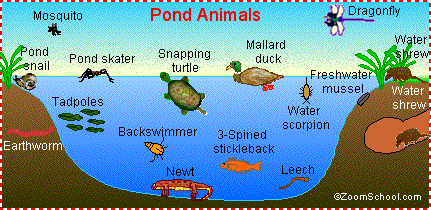

In [34]:
# image 0

from IPython.display import Image

print(img_contains_frog(process_img_path('example0.jpg')))
Image(filename='example0.jpg', width=500)

[('n01443537', 'goldfish', 0.8495882), ('n01631663', 'eft', 0.06760146), ('n02536864', 'coho', 0.03516317)]
0.0


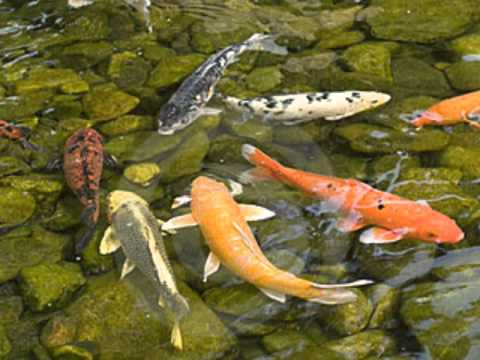

In [33]:
# image 1

print(img_contains_frog(process_img_path('example1.jpg')))
Image(filename='example1.jpg', width=500)

[('n04243546', 'slot', 0.8712437), ('n04476259', 'tray', 0.049936477), ('n03908618', 'pencil_box', 0.02307264)]
0.0


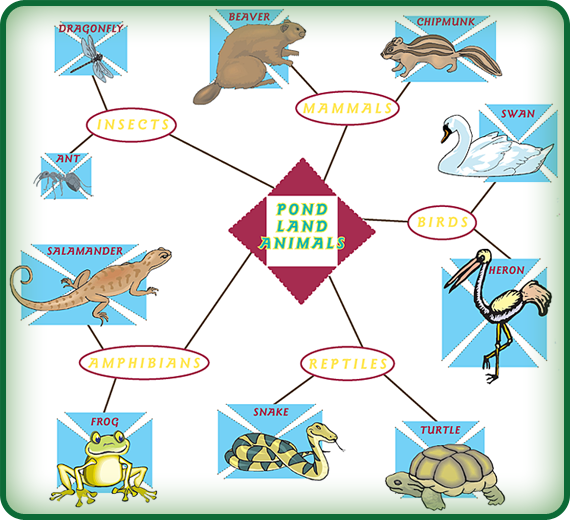

In [35]:
# image 2

print(img_contains_frog(process_img_path('example2.jpg')))
Image(filename='example2.jpg', width=500)

[('n02442845', 'mink', 0.3097655), ('n02363005', 'beaver', 0.23398967), ('n02361337', 'marmot', 0.2079685)]
0.0


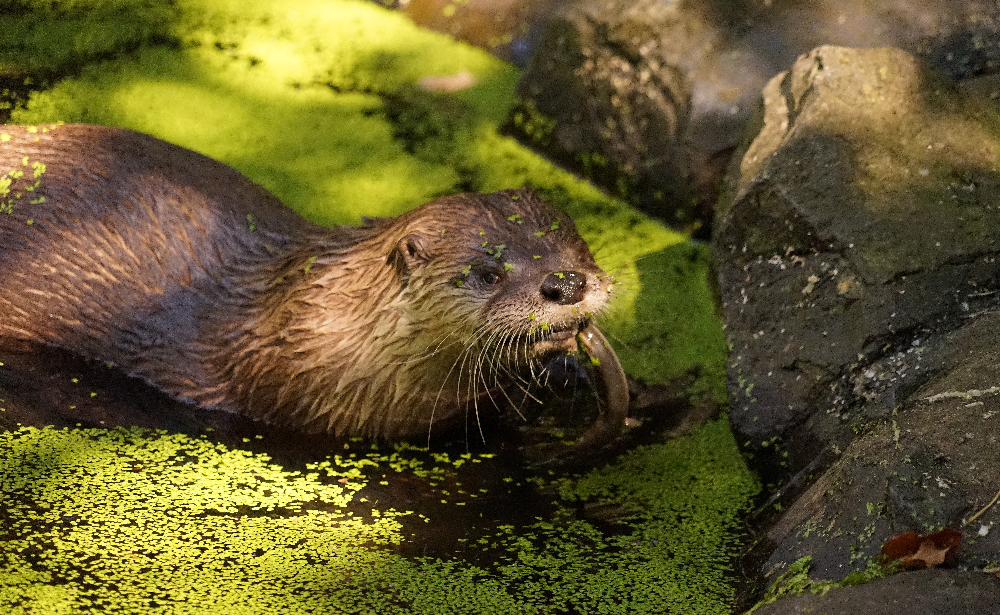

In [36]:
# image 3

print(img_contains_frog(process_img_path('example3.jpg')))
Image(filename='example3.jpg', width=500)

[('n03485794', 'handkerchief', 0.88227284), ('n02834397', 'bib', 0.022680832), ('n03291819', 'envelope', 0.020095235)]
0.0


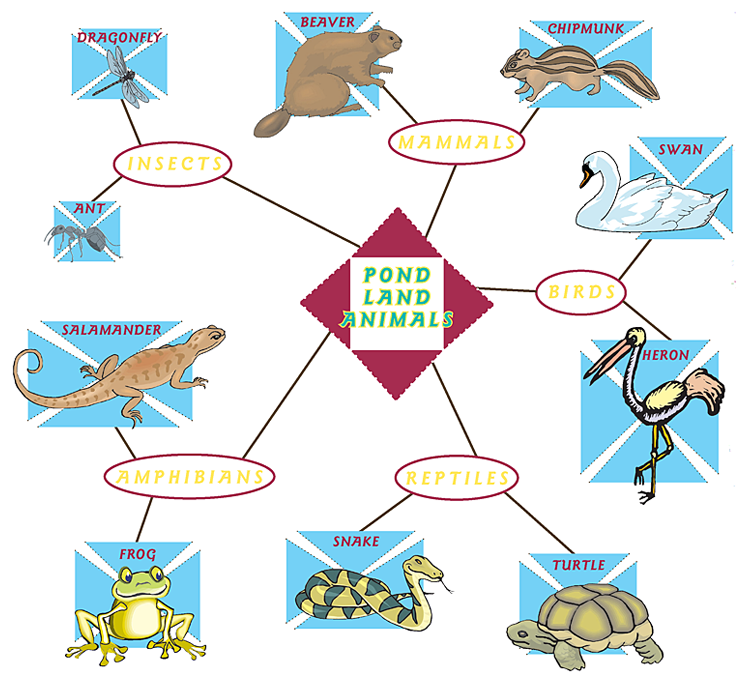

In [37]:
# image 4

print(img_contains_frog(process_img_path('example4.jpg')))
Image(filename='example4.jpg', width=500)

At time of writing at least a few do, but since the Internet changes - it is possible your 5 won't. You can easily verify yourself, and (once you have working code) increase the number of images you pull to be more sure of getting a frog. Your goal is to validly run ResNet50 on the input images - don't worry about tuning or improving the model.

*Hint* - ResNet 50 doesn't just return "frog". The three labels it has for frogs are: `bullfrog, tree frog, tailed frog`

*Stretch goal* - also check for fish.

<a id="p3"></a>
## Part 3 - Generative Adverserial Networks (GANS)

Describe the difference between a discriminator and generator in a GAN in your own words.

__*Your Answer:*__ 

Discriminative algorithms try to classify input data. Given the features of an instance of data, they predict a label or category to which that data belongs.

Generative algorithms do the opposite. Instead of predicting a label given certain features, they attempt to predict features given a certain label.

<a id="p4"></a>
## Part 4 - More...

Answer the following questions, with a target audience of a fellow Data Scientist:

- What do you consider your strongest area, as a Data Scientist?
    - I think data storytelling and visualizing data came very naturally to me and could be a strength for communicating results to those I would work with.
- What area of Data Science would you most like to learn more about, and why?
    - NLP. It was very interesting to me and I think there are so many directions that you could take using NLP technology.
- Where do you think Data Science will be in 5 years?
    - I think there will be many more specialties to focus on and become an expert in. Also growth of AI and pushing the boundaries of what we can get AI to accomplish. 
- What are the treats posed by AI to our society?
    - Treats? If AI can start making treats, I'd be totally on board.
- How do you think we can counteract those threats? 
    - The best way to counteract threats would be diversifying who has access to this information. The more people that are in the know, the more people can step in and ensure that this technology is being used in an ethical way.
- Do you think achieving General Artifical Intelligence is ever possible?
    - Probably a ways in the future, yes.

A few sentences per answer is fine - only elaborate if time allows.

## Congratulations! 

Thank you for your hard work, and congratulations! You've learned a lot, and you should proudly call yourself a Data Scientist.


In [38]:
from IPython.display import HTML

HTML("""<iframe src="https://giphy.com/embed/26xivLqkv86uJzqWk" width="480" height="270" frameBorder="0" class="giphy-embed" allowFullScreen></iframe><p><a href="https://giphy.com/gifs/mumm-champagne-saber-26xivLqkv86uJzqWk">via GIPHY</a></p>""")